In [1]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'speech-emotion-recognition-en:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1118008%2F1877714%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240320%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240320T223226Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D6dedb915fefff87eaee7b2070476e0481b9d6d47c21bc9786b57026208ae3fe06ce8529512a753d0d9cdbf748ef3c368e9f5ab3eb5663d493e17abeea8a4ecf186883c41aa366033f7e54d9c842fdab4c886f0cc05b7f98137a1b3a7cb2e37e8ed19c3ea70823c8eb433fd052bd5304be6f8b904104769caed8a2a8a6f1be4a7d5d2a1d0035b54a6f16b35cc506d9f89696c6c0245429fa10d31aaeafbafb4964e29a4a5e0139cb235fdcc66a4f098ae39aa59ab024060104bf51b310f3f47cc96c55ff10b25d90aa30ab5fa8db4f7a9519850b81282e36e542166f978686cc5626dcd0afc4864f261a89b2d7446172936082dd5cde728e0146f5e59263487dc,audioo:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4542743%2F7766293%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240320%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240320T223227Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D63d3c336e6da709f98feac6fdca79746878bc9155c2f4f917d5af9a60d0555723540e38076c1709b4b2d230855b51f294fcaf072435a51f9a87341e1f5deb4de0a8a28df6ecb8ccb094c8d1acd235fe71ecb951f0e97a6bf69cccbab2b8ac585e458c755ce20428b721da42649fd6bf7cd7f60d50613b9bc300679e699cc95b184341626d1b59b2bbdda917ecac7c15cee6da3629f4edcc292075f8deab1284757eb4265788184efe898d09388bf43a381284d292de9639ae665bff72f3094ca5d7fda0a9cb6a01d8d04ea12734d5c73186ac899cc8cd70322e743a2b697a009aa1a8aaaad12e237e4f07f1414398c2d1de5c7745e2ff778c443e7b77e9faabf,sad-audio-1:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4638339%2F7898382%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240320%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240320T223227Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3baa602bc4bb21f831e74bec3343edeaad065b7e2d7700c16c7a021796246604169507eb71c188ae1c9baa8f8c5ca76685c135b971f49183eed54671c5be0cccd86a1ffe5e54311031b7d5fa87968eb2e2ebc70d12cad50e51ed438860c26a4e8c71cc6524b2cd5e6408bbf4e47366b211dee8bdeb4404749d15d9f58cdd2471db79e89aaaf71a06e763c06e26e9ad42900498471d8d79c1e810970c52c8aa2541953b9101136a97746f79db46daa8592894ec2f0da8a82a651118e2ac890cb675a9ab03326e6c504992d46396191a96229de2533e94d2b205a2237e57f029c3e6db983cb75c97f663b135ea77322a695d9bc61eb7f97c5eb75543e709e22acb,surprise-audio-1:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4638390%2F7898458%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240320%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240320T223227Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D9e1826560c89db6408d3536b66fded8ddc3625eceadb2fd057e601601fd951aee74620866b90b3bebd8f7dfd53f408ede5f42f2b37f14043ce7caa9f027c6185538c090f6d884c65a6af31ee0250571520eedf6d2a59f2de623815f17ad6ad04e79d481d40c128c67e5ac6f17979ee3c30b3c0da6a5b77cde8ea9a7482d3ed0f0545d5b51babf6aebf10ac700b9ae74d2d214b2f5bcc2ba8f1dbfe772abd9ee3ca405f5634d7ba8a8948c81a79e7058950cf7d42e1857cb5eddcce7a0ddc832619d2ebfa982e3b9765ba67bd49b5f13506cb60011e8c684d14bc471b28f4ca8113262e4e4cc6035271f1c1282d8af60e6093081517b56bff3ae365b152a6f68b'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 1035070855 bytes downloaded
Downloaded and uncompressed: speech-emotion-recognition-en
[==================================================] 720620 bytes downloaded
Downloaded and uncompressed: audioo
[==================================================] 3363759 bytes downloaded
Downloaded and uncompressed: sad-audio-1
[==================================================] 63070 bytes downloaded
Downloaded and uncompressed: surprise-audio-1
Data source import complete.


## Speech Emotion Recognition

Basic Algorithms used:


In [2]:
import os
import re
import librosa
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Audio
from keras import layers
from keras import models
from tensorflow.keras import utils
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from tensorflow.python.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import itertools

In [3]:
Ravdess="/kaggle/input/speech-emotion-recognition-en/Ravdess/audio_speech_actors_01-24"
Crema="/kaggle/input/speech-emotion-recognition-en/Crema"
Savee="/kaggle/input/speech-emotion-recognition-en/Savee"
Tess="/kaggle/input/speech-emotion-recognition-en/Tess"


## Data Preparation

**Ravdess**

In [4]:
ravdess_directory_list = os.listdir(Ravdess)

emotion_df = []

for dir in ravdess_directory_list:
    actor = os.listdir(os.path.join(Ravdess, dir))
    for wav in actor:
        info = wav.partition(".wav")[0].split("-")
        emotion = int(info[2])
        emotion_df.append((emotion, os.path.join(Ravdess, dir, wav)))

In [5]:
Ravdess_df = pd.DataFrame.from_dict(emotion_df)
Ravdess_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)
Ravdess_df.Emotion.replace({1:'neutral', 2:'neutral', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'}, inplace=True)
Ravdess_df.head()

,Emotion,Path
0,neutral,/kaggle/input/speech-emotion-recognition-en/Ra...
1,fear,/kaggle/input/speech-emotion-recognition-en/Ra...
2,surprise,/kaggle/input/speech-emotion-recognition-en/Ra...
3,sad,/kaggle/input/speech-emotion-recognition-en/Ra...
4,disgust,/kaggle/input/speech-emotion-recognition-en/Ra...


Crema

In [6]:
emotion_df = []

for wav in os.listdir(Crema):
    info = wav.partition(".wav")[0].split("_")
    if info[2] == 'SAD':
        emotion_df.append(("sad", Crema + "/" + wav))
    elif info[2] == 'ANG':
        emotion_df.append(("angry", Crema + "/" + wav))
    elif info[2] == 'DIS':
        emotion_df.append(("disgust", Crema + "/" + wav))
    elif info[2] == 'FEA':
        emotion_df.append(("fear", Crema + "/" + wav))
    elif info[2] == 'HAP':
        emotion_df.append(("happy", Crema + "/" + wav))
    elif info[2] == 'NEU':
        emotion_df.append(("neutral", Crema + "/" + wav))
    else:
        emotion_df.append(("unknown", Crema + "/" + wav))


Crema_df = pd.DataFrame.from_dict(emotion_df)
Crema_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Crema_df.head()

,Emotion,Path
0,fear,/kaggle/input/speech-emotion-recognition-en/Cr...
1,fear,/kaggle/input/speech-emotion-recognition-en/Cr...
2,neutral,/kaggle/input/speech-emotion-recognition-en/Cr...
3,sad,/kaggle/input/speech-emotion-recognition-en/Cr...
4,happy,/kaggle/input/speech-emotion-recognition-en/Cr...


In [7]:
tess_directory_list = os.listdir(Tess)

emotion_df = []

for dir in tess_directory_list:
    for wav in os.listdir(os.path.join(Tess, dir)):
        info = wav.partition(".wav")[0].split("_")
        emo = info[2]
        if emo == "ps":
            emotion_df.append(("surprise", os.path.join(Tess, dir, wav)))
        else:
            emotion_df.append((emo, os.path.join(Tess, dir, wav)))


Tess_df = pd.DataFrame.from_dict(emotion_df)
Tess_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Tess_df.head()

,Emotion,Path
0,sad,/kaggle/input/speech-emotion-recognition-en/Te...
1,sad,/kaggle/input/speech-emotion-recognition-en/Te...
2,sad,/kaggle/input/speech-emotion-recognition-en/Te...
3,sad,/kaggle/input/speech-emotion-recognition-en/Te...
4,sad,/kaggle/input/speech-emotion-recognition-en/Te...


In [8]:
savee_directiory_list = os.listdir(Savee)

emotion_df = []

for wav in savee_directiory_list:
    info = wav.partition(".wav")[0].split("_")[1].replace(r"[0-9]", "")
    emotion = re.split(r"[0-9]", info)[0]
    if emotion=='a':
        emotion_df.append(("angry", Savee + "/" + wav))
    elif emotion=='d':
        emotion_df.append(("disgust", Savee + "/" + wav))
    elif emotion=='f':
        emotion_df.append(("fear", Savee + "/" + wav))
    elif emotion=='h':
        emotion_df.append(("happy", Savee + "/" + wav))
    elif emotion=='n':
        emotion_df.append(("neutral", Savee + "/" + wav))
    elif emotion=='sa':
        emotion_df.append(("sad", Savee + "/" + wav))
    else:
        emotion_df.append(("surprise", Savee + "/" + wav))


Savee_df = pd.DataFrame.from_dict(emotion_df)
Savee_df.rename(columns={1 : "Path", 0 : "Emotion"}, inplace=True)

Savee_df.head()

,Emotion,Path
0,angry,/kaggle/input/speech-emotion-recognition-en/Sa...
1,happy,/kaggle/input/speech-emotion-recognition-en/Sa...
2,neutral,/kaggle/input/speech-emotion-recognition-en/Sa...
3,happy,/kaggle/input/speech-emotion-recognition-en/Sa...
4,happy,/kaggle/input/speech-emotion-recognition-en/Sa...


Concatanating all datasets

In [9]:
# Let's concat all datasets together for doing some analysis
df = pd.concat([Ravdess_df, Crema_df, Tess_df, Savee_df], axis=0)
df.shape

(12162, 2)

In [10]:
df.head()

,Emotion,Path
0,neutral,/kaggle/input/speech-emotion-recognition-en/Ra...
1,fear,/kaggle/input/speech-emotion-recognition-en/Ra...
2,surprise,/kaggle/input/speech-emotion-recognition-en/Ra...
3,sad,/kaggle/input/speech-emotion-recognition-en/Ra...
4,disgust,/kaggle/input/speech-emotion-recognition-en/Ra...


## EDA

Value Counts

<Axes: title={'center': 'Emotion Counts'}, xlabel='Emotion', ylabel='Count'>

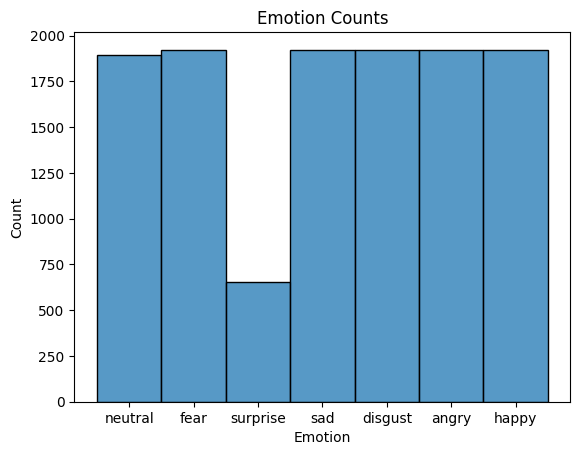

In [11]:
plt.title("Emotion Counts")
sns.histplot(x=df["Emotion"])


## Data Visualization

Waveplot

In [12]:
def waveplot(data, sr, e):
    plt.figure(figsize=(10,3))
    plt.title(f'Emotion: {e}')
    librosa.display.waveshow(data, sr=sr)
    plt.show()

There are two types of waveplots: Amplitude vs Sample Rate, and vs Time.

Documentation: when the plot spans a time interval of less than max_points / sr (by default, 1/2 second), the samples-based view is used, and otherwise a downsampled amplitude envelope is used

Spectrogram

In [13]:
def spectrogram(data, sr, e):
    X=librosa.stft(data)
    Xdb=librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12,3))
    plt.title(f'Spectrogram of {e} emotion')
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()

For Each Emotion:


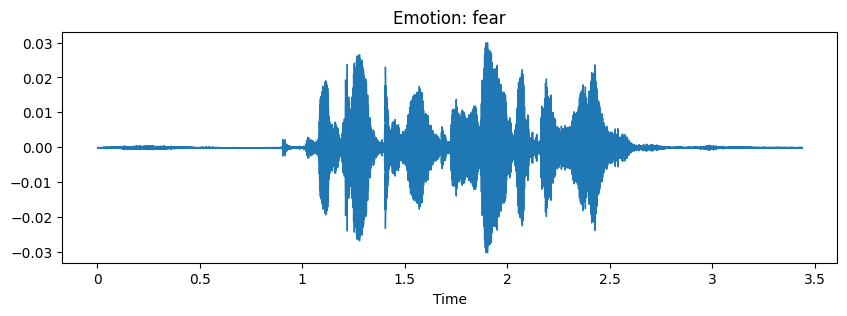

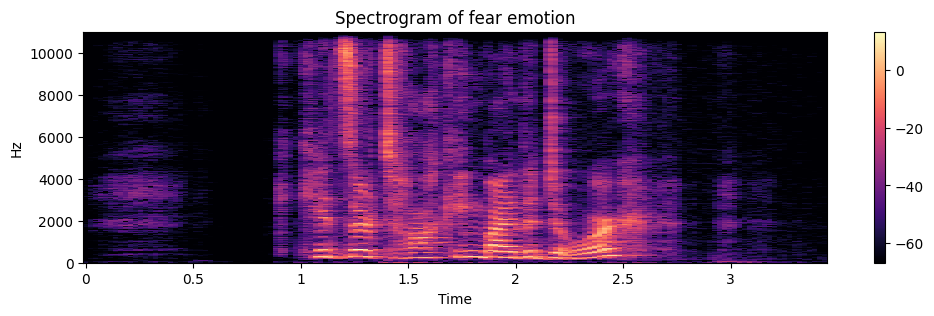

In [14]:
emotion='fear'
path=np.array(df.Path[df.Emotion==emotion])[1]
data, sr = librosa.load(path)
waveplot(data, sr, emotion)
spectrogram(data, sr, emotion)
Audio(path)

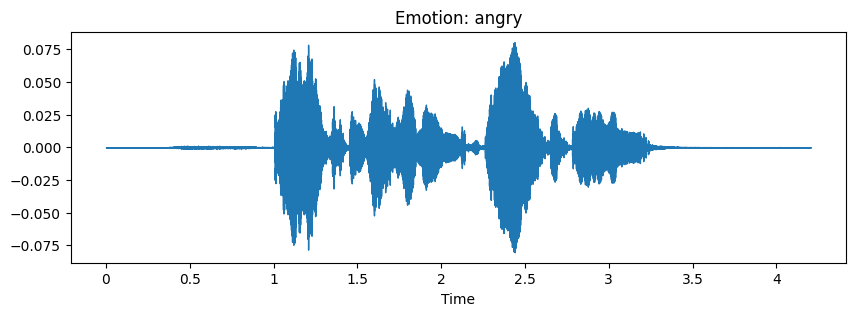

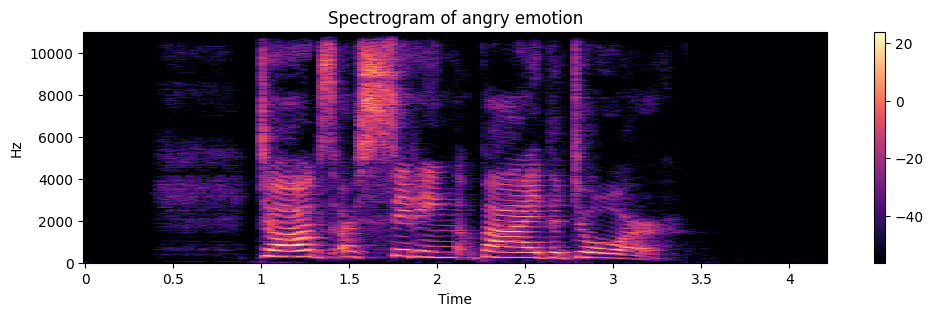

In [15]:
emotion='angry'
path=np.array(df.Path[df.Emotion==emotion])[1]
data, sr = librosa.load(path)
waveplot(data, sr, emotion)
spectrogram(data, sr, emotion)
Audio(path)

## Data Augmentation

These features are added to ensure that model is trained to handle if the test/valisation data has some noise or stretching

Features to be applied:
* Noise
* Stretching
* Shifting
* Pitching

In [16]:
def noise(data, random=False, rate=0.035, threshold=0.075):
    noise_amp = rate*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=rate)

def shift(data, rate=1000):
    shift_range = int(np.random.uniform(low=-5, high= 5)*rate)
    return librosa.effects.roll(data, shift_range)

def pitch(data, sr, n_steps=2, random=False):
    return librosa.effects.pitch_shift(data, sr=sr, n_steps=n_steps)

Example applied on audio

In [17]:
path=df[df["Emotion"] == "happy"]["Path"].iloc[1]
data, sr=librosa.load(path)

simple

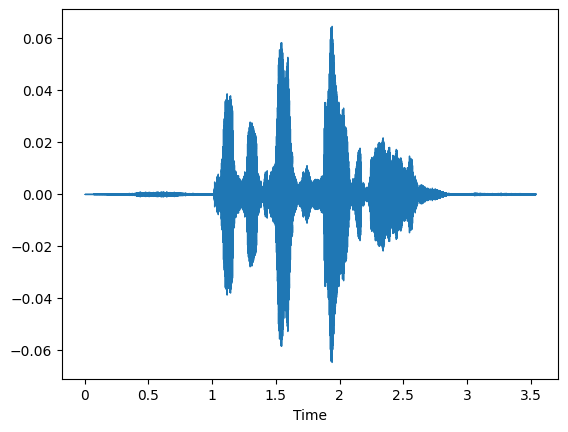

In [18]:
librosa.display.waveshow(data, sr=sr)
Audio(path)

noise

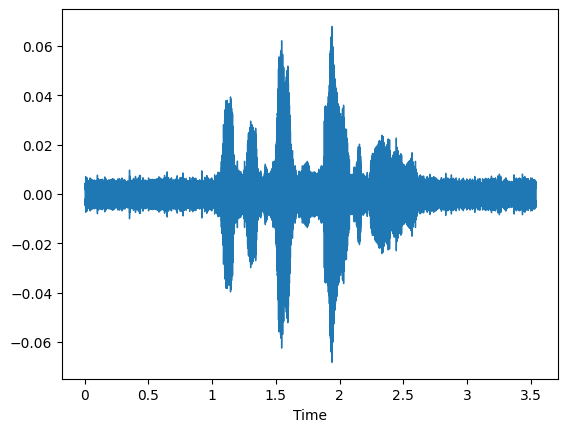

In [19]:
noised_data = noise(data)
librosa.display.waveshow(noised_data, sr=sr)
Audio(noised_data, rate=sr)

stretch

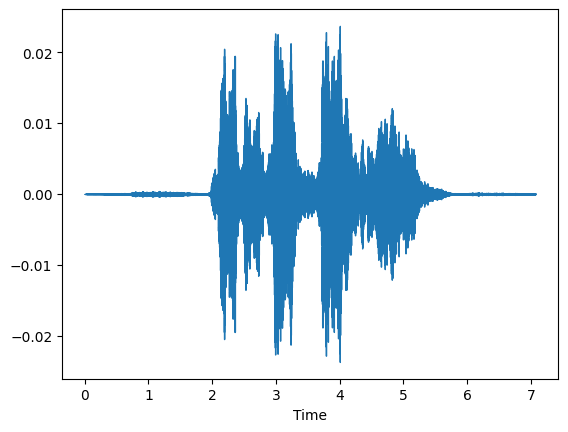

In [20]:
stretched_data = stretch(data, rate=0.5)
librosa.display.waveshow(stretched_data, sr=sr)
Audio(stretched_data, rate=sr)

pitch

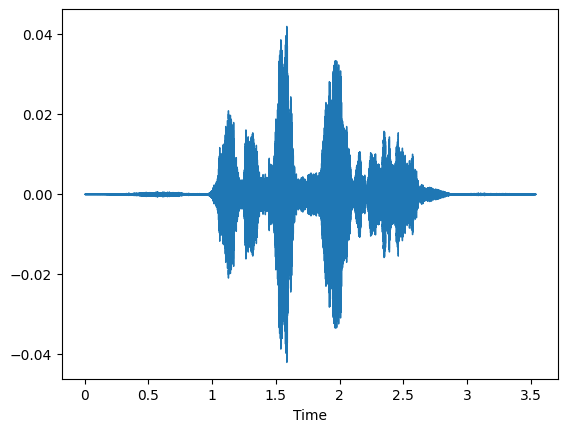

In [21]:
pitched_data = pitch(data, sr=100)
librosa.display.waveshow(pitched_data, sr=sr)
Audio(pitched_data, rate=sr)

## Feature Extraction

In [22]:
n_fft = 2048
hop_length = 512
def chunks(data, frame_length, hop_length):
    for i in range(0, len(data), hop_length):
        yield data[i:i+frame_length]

# Zero Crossing Rate
def zcr(data, frame_length=2048, hop_length=512):
    zcr = librosa.feature.zero_crossing_rate(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(zcr)


def energy(data, frame_length=2048, hop_length=512):
    en = np.array([np.sum(np.power(np.abs(data[hop:hop+frame_length]), 2)) for hop in range(0, data.shape[0], hop_length)])
    return en / frame_length


def rmse(data, frame_length=2048, hop_length=512):
    rmse = librosa.feature.rms(y=data, frame_length=frame_length, hop_length=hop_length)
    return np.squeeze(rmse)


def entropy_of_energy(data, frame_length=2048, hop_length=512):
    energies = energy(data, frame_length, hop_length)
    energies /= np.sum(energies)

    entropy = 0.0
    entropy -= energies * np.log2(energies)
    return entropy


def spc(data, sr, frame_length=2048, hop_length=512):
    spectral_centroid = librosa.feature.spectral_centroid(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(spectral_centroid)


# def spc_entropy(data, sr):
#     spc_en = spectral_entropy(data, sf=sr, method="fft")
#     return spc_en

def spc_flux(data):
    isSpectrum = data.ndim == 1
    if isSpectrum:
        data = np.expand_dims(data, axis=1)

    X = np.c_[data[:, 0], data]
    af_Delta_X = np.diff(X, 1, axis=1)
    vsf = np.sqrt((np.power(af_Delta_X, 2).sum(axis=0))) / X.shape[0]

    return np.squeeze(vsf) if isSpectrum else vsf


def spc_rollof(data, sr, frame_length=2048, hop_length=512):
    spcrollof = librosa.feature.spectral_rolloff(y=data, sr=sr, n_fft=frame_length, hop_length=hop_length)
    return np.squeeze(spcrollof)


def chroma_stft(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    stft = np.abs(librosa.stft(data))
    chroma_stft = librosa.feature.chroma_stft(S=stft, sr=sr)
    return np.squeeze(chroma_stft.T) if not flatten else np.ravel(chroma_stft.T)


def mel_spc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mel = librosa.feature.melspectrogram(y=data, sr=sr)
    return np.squeeze(mel.T) if not flatten else np.ravel(mel.T)

def mfcc(data, sr, frame_length=2048, hop_length=512, flatten: bool = True):
    mfcc_feature = librosa.feature.mfcc(y=data, sr=sr)
    return np.squeeze(mfcc_feature.T) if not flatten else np.ravel(mfcc_feature.T)

In [23]:
path = np.array(df["Path"])[658]
data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
len(data)

55125

In [24]:
print("ZCR: ", zcr(data).shape)
print("Energy: ", energy(data).shape)
print("Entropy of Energy :", entropy_of_energy(data).shape)
print("RMS :", rmse(data).shape)
print("Spectral Centroid :", spc(data, sr).shape)
# print("Spectral Entropy: ", spc_entropy(data, sampling_rate).shape)
print("Spectral Flux: ", spc_flux(data).shape)
print("Spectral Rollof: ", spc_rollof(data, sr).shape)
print("Chroma STFT: ", chroma_stft(data, sr).shape)
print("MelSpectrogram: ", mel_spc(data, sr).shape)
print("MFCC: ", mfcc(data, sr).shape)



ZCR:  (108,)
Energy:  (108,)
Entropy of Energy : (108,)
RMS : (108,)
Spectral Centroid : (108,)
Spectral Flux:  ()
Spectral Rollof:  (108,)
Chroma STFT:  (1296,)
MelSpectrogram:  (13824,)
MFCC:  (2160,)


We will only use ZCR, RMS and MFCC

In [25]:
def extract_features(data, sr, frame_length=2048, hop_length=512):
    result = np.array([])
    result = np.hstack((result,
                        zcr(data, frame_length, hop_length),
                        rmse(data, frame_length, hop_length),
                        mfcc(data, sr, frame_length, hop_length)))
    return result


to trim the starting and ending of audio files which do not have any sound, we use duration and offset

In [26]:
def get_features(path, duration=2.5, offset=0.6):
    data, sr= librosa.load(path, duration=duration, offset=offset)
    res1=extract_features(data, sr)
    result=np.array(res1)

    noised_data=noise(data, random=True)
    res2=extract_features(noised_data, sr)
    result=np.vstack((result, res2))

    pitched_data = pitch(data, sr, random=True)
    res3=extract_features(pitched_data, sr)
    result=np.vstack((result, res3))

    only_noise_data = noise(data, random=True)
    noise_and_pitch_data = pitch(only_noise_data,sr, random=True)
    res3=extract_features(noise_and_pitch_data, sr)
    result=np.vstack((result, res3))

    return result

here we extract features from all input audio files, using get_features method, which calls extract_features on the augmented data, which extracts features like mfcc, zcr, etc from the augmented data, and it is finally stored in X.

Y stores the label for each corresponding X values.

This kinda creates a dataset with input values(X) being the features extracted from the augmented audio files, and output values(Y) storing the labels associated with it.

In [27]:
X,Y=[],[]
for path, emotion, status in zip(df.Path, df.Emotion, range(df.Path.shape[0])):
    features=get_features(path)
    if status % 100 == 0:
        print(f'{status} samples have been processed, out of {df.shape[0]} samples')
    for ele in features:
        X.append(ele)
        Y.append(emotion)
print("Done")

0 samples have been processed, out of 12162 samples
100 samples have been processed, out of 12162 samples
200 samples have been processed, out of 12162 samples
300 samples have been processed, out of 12162 samples
400 samples have been processed, out of 12162 samples
500 samples have been processed, out of 12162 samples
600 samples have been processed, out of 12162 samples
700 samples have been processed, out of 12162 samples
800 samples have been processed, out of 12162 samples
900 samples have been processed, out of 12162 samples
1000 samples have been processed, out of 12162 samples
1100 samples have been processed, out of 12162 samples
1200 samples have been processed, out of 12162 samples
1300 samples have been processed, out of 12162 samples
1400 samples have been processed, out of 12162 samples
1500 samples have been processed, out of 12162 samples
1600 samples have been processed, out of 12162 samples
1700 samples have been processed, out of 12162 samples
1800 samples have been

In [28]:
features_path = "./features.csv"

In [29]:
extracted_df=pd.DataFrame(X)
extracted_df["labels"]=Y
extracted_df.to_csv(features_path, index=False)
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,labels
0,0.319824,0.401367,0.496582,0.500977,0.422363,0.468750,0.457520,0.330566,0.299805,0.255371,...,-17.146278,5.976326,9.155354,-8.887676,-2.853044,-0.871931,4.785558,-6.813532,-2.010329,neutral
1,0.229004,0.289062,0.355957,0.365234,0.312988,0.362305,0.363770,0.274902,0.243164,0.197266,...,-17.153420,5.951367,9.118068,-8.837106,-2.825475,-0.895794,4.787546,-6.845539,-2.000668,neutral
2,0.112305,0.138672,0.182617,0.171387,0.185059,0.183594,0.153320,0.108398,0.062500,0.054688,...,-6.960388,11.964083,-2.241893,-1.908680,6.746730,-0.335519,-2.565856,-4.248004,8.978401,neutral
3,0.242188,0.360352,0.483398,0.470703,0.474609,0.471680,0.468750,0.475098,0.457520,0.466309,...,-1.964208,2.395329,7.129971,-6.587869,-3.862844,-13.250619,-8.859343,-4.355444,4.639142,neutral
4,0.147461,0.228516,0.287598,0.246582,0.232422,0.155273,0.113281,0.078125,0.041016,0.059570,...,-9.390147,17.210724,6.637711,-3.012077,-3.615360,2.084774,12.428753,-10.798904,-12.229467,fear


In [30]:
extracted_df = pd.read_csv(features_path)
extracted_df.shape

(48648, 2377)

In [31]:
# Fill NaN with 0
extracted_df = extracted_df.fillna(0)
print(extracted_df.isna().any())
extracted_df.shape


0         False
1         False
2         False
3         False
4         False
          ...  
2372      False
2373      False
2374      False
2375      False
labels    False
Length: 2377, dtype: bool


(48648, 2377)

In [32]:
extracted_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2367,2368,2369,2370,2371,2372,2373,2374,2375,labels
0,0.319824,0.401367,0.496582,0.500977,0.422363,0.468750,0.457520,0.330566,0.299805,0.255371,...,-17.146278,5.976326,9.155354,-8.887676,-2.853044,-0.871931,4.785558,-6.813532,-2.010329,neutral
1,0.229004,0.289062,0.355957,0.365234,0.312988,0.362305,0.363770,0.274902,0.243164,0.197266,...,-17.153420,5.951367,9.118068,-8.837106,-2.825475,-0.895794,4.787546,-6.845539,-2.000668,neutral
2,0.112305,0.138672,0.182617,0.171387,0.185059,0.183594,0.153320,0.108398,0.062500,0.054688,...,-6.960388,11.964083,-2.241893,-1.908680,6.746730,-0.335519,-2.565856,-4.248004,8.978401,neutral
3,0.242188,0.360352,0.483398,0.470703,0.474609,0.471680,0.468750,0.475098,0.457520,0.466309,...,-1.964208,2.395329,7.129971,-6.587869,-3.862844,-13.250619,-8.859343,-4.355444,4.639142,neutral
4,0.147461,0.228516,0.287598,0.246582,0.232422,0.155273,0.113281,0.078125,0.041016,0.059570,...,-9.390147,17.210724,6.637711,-3.012077,-3.615360,2.084774,12.428753,-10.798904,-12.229467,fear


In [33]:
# Inspect the DataFrame
print(extracted_df.head())

# Check column names and data types
print(extracted_df.info())


          0         1         2         3         4         5         6  \
0  0.319824  0.401367  0.496582  0.500977  0.422363  0.468750  0.457520   
1  0.229004  0.289062  0.355957  0.365234  0.312988  0.362305  0.363770   
2  0.112305  0.138672  0.182617  0.171387  0.185059  0.183594  0.153320   
3  0.242188  0.360352  0.483398  0.470703  0.474609  0.471680  0.468750   
4  0.147461  0.228516  0.287598  0.246582  0.232422  0.155273  0.113281   

          7         8         9  ...       2367       2368      2369  \
0  0.330566  0.299805  0.255371  ... -17.146278   5.976326  9.155354   
1  0.274902  0.243164  0.197266  ... -17.153420   5.951367  9.118068   
2  0.108398  0.062500  0.054688  ...  -6.960388  11.964083 -2.241893   
3  0.475098  0.457520  0.466309  ...  -1.964208   2.395329  7.129971   
4  0.078125  0.041016  0.059570  ...  -9.390147  17.210724  6.637711   

       2370      2371       2372       2373       2374       2375   labels  
0 -8.887676 -2.853044  -0.871931   4.78

In [34]:
X=extracted_df.drop(labels="labels", axis=1)
Y=extracted_df["labels"]

In [35]:
le=LabelEncoder()
Y=utils.to_categorical(le.fit_transform(Y))
le.classes_

array(['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise'],
      dtype=object)

In [36]:
Y

array([[0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.]], dtype=float32)

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.2, random_state=42, shuffle=True)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((38918, 2376), (9730, 2376), (38918, 7), (9730, 7))

In [38]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((35026, 2376), (3892, 2376), (35026, 7), (3892, 7))

## Standardize Data

In [39]:
# Standardize data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_val = scaler.transform(X_val)
X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape

((35026, 2376), (9730, 2376), (3892, 2376), (35026, 7), (9730, 7), (3892, 7))

In [40]:
# We have to use 1-dimensional CNN which need specifical shape:
X_train = np.expand_dims(X_train, axis=2)
X_val = np.expand_dims(X_val, axis=2)
X_test = np.expand_dims(X_test, axis=2)
X_train.shape

(35026, 2376, 1)

In [41]:
earlystopping = EarlyStopping(monitor ="val_acc",
                              mode = 'auto', patience = 5,
                              restore_best_weights = True)


In [42]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc',
                                            patience=3,
                                            verbose=1,
                                            factor=0.5,
                                            min_lr=0.00001)

In [60]:
import tensorflow as tf
import tensorflow.keras.backend as K
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [44]:
model = models.Sequential()
model.add(layers.Conv1D(512, kernel_size=5, strides=1,
                        padding="same", activation="relu",
                        input_shape=(X_train.shape[1], 1)))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size=5, strides=2, padding="same"))

model.add(layers.Conv1D(512, kernel_size=5, strides=1,
                        padding="same", activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size=5, strides=2, padding="same"))

model.add(layers.Conv1D(256, kernel_size=5, strides=1,
                        padding="same", activation="relu"))
model.add(layers.BatchNormalization())
model.add(layers.MaxPool1D(pool_size=5, strides=2, padding="same"))

model.add(layers.Conv1D(256, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model.add(layers.Conv1D(128, kernel_size=3, strides=1, padding='same', activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling1D(pool_size=3, strides = 2, padding = 'same'))

model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.Dense(7, activation="softmax"))

model.compile(optimizer="rmsprop", loss="categorical_crossentropy", metrics=["acc", f1_m])


In [45]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 2376, 512)         3072      
                                                                 
 batch_normalization (Batch  (None, 2376, 512)         2048      
 Normalization)                                                  
                                                                 
 max_pooling1d (MaxPooling1  (None, 1188, 512)         0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 1188, 512)         1311232   
                                                                 
 batch_normalization_1 (Bat  (None, 1188, 512)         2048      
 chNormalization)                                                
                                                        

In [46]:
EPOCHS = 50
batch_size = 64

In [48]:
# Train the model with ReduceLROnPlateau callback
history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                    epochs=EPOCHS, batch_size=batch_size,
                    callbacks=[earlystopping, learning_rate_reduction])


Epoch 1/50
548/548 [==============================] - 197s 315ms/step - loss: 1.4530 - acc: 0.4617 - f1_m: 0.3908 - val_loss: 1.3706 - val_acc: 0.4782 - val_f1_m: 0.3922 - lr: 0.0010
Epoch 2/50
548/548 [==============================] - 171s 313ms/step - loss: 1.1087 - acc: 0.5731 - f1_m: 0.5303 - val_loss: 1.4821 - val_acc: 0.4992 - val_f1_m: 0.4679 - lr: 0.0010
Epoch 3/50
548/548 [==============================] - 171s 313ms/step - loss: 0.9791 - acc: 0.6233 - f1_m: 0.5911 - val_loss: 1.1257 - val_acc: 0.5876 - val_f1_m: 0.5694 - lr: 0.0010
Epoch 4/50
548/548 [==============================] - 171s 313ms/step - loss: 0.8560 - acc: 0.6738 - f1_m: 0.6541 - val_loss: 1.0233 - val_acc: 0.6123 - val_f1_m: 0.6002 - lr: 0.0010
Epoch 5/50
548/548 [==============================] - 172s 313ms/step - loss: 0.7326 - acc: 0.7274 - f1_m: 0.7158 - val_loss: 1.0853 - val_acc: 0.6241 - val_f1_m: 0.6124 - lr: 0.0010
Epoch 6/50
548/548 [==============================] - 171s 313ms/step - loss: 0.6078 

305/305 [==============================] - 16s 48ms/step - loss: 0.3128 - acc: 0.9406 - f1_m: 0.9409
Accuracy of our model on test data :  94.05961036682129 %


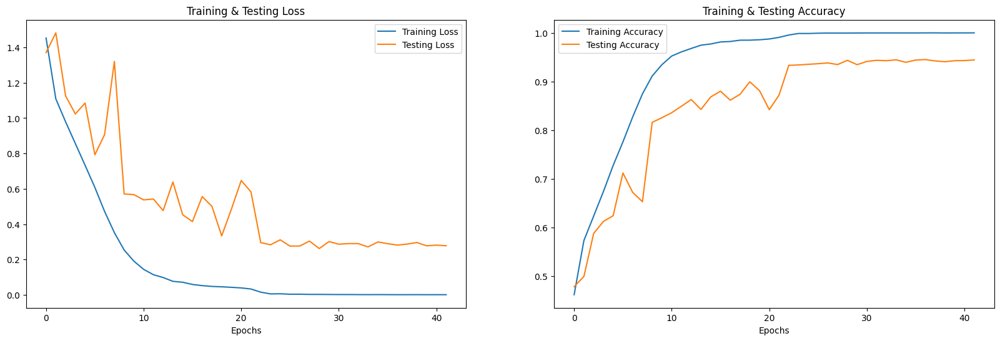

In [49]:
print("Accuracy of our model on test data : " , model.evaluate(X_test,y_test)[1]*100 , "%")

fig , ax = plt.subplots(1,2)
train_acc = history.history['acc']
train_loss = history.history['loss']
test_acc = history.history['val_acc']
test_loss = history.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(train_loss, label = 'Training Loss')
ax[0].plot(test_loss , label = 'Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(train_acc, label = 'Training Accuracy')
ax[1].plot(test_acc , label = 'Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.show()


In [50]:
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
y_pred

305/305 [==============================] - 15s 46ms/step


array([4, 2, 1, ..., 0, 4, 2])

In [51]:
y_check = np.argmax(y_test, axis=1)
y_check

array([4, 2, 1, ..., 0, 4, 2])

In [52]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=y_check, y_pred=y_pred)

In [53]:
def plot_confusion_matrix(cm, classes,
                        normalize=False,
                        title='Confusion matrix',
                        cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization
[[1445   19   14   19   11    5    4]
 [  12 1472   22   25   17   23    4]
 [  16   13 1407   34   12   29    7]
 [  24   10   36 1459   19    7   13]
 [   3   16    7   19 1499   17    1]
 [   4   17   39    7   35 1374    2]
 [   3    1    4    5    1    2  496]]


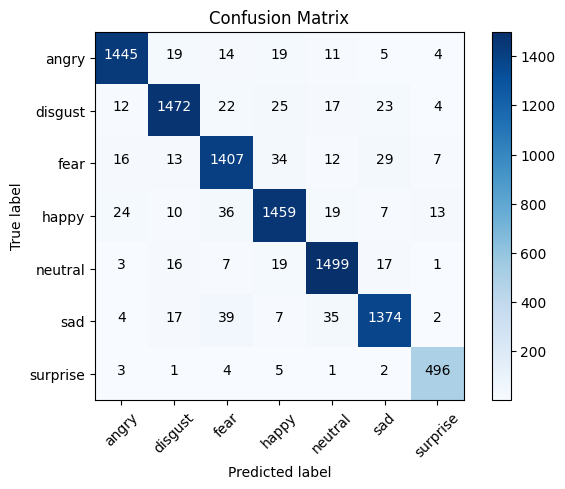

In [54]:
cm_plot_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']
plot_confusion_matrix(cm=cm, classes=cm_plot_labels, title='Confusion Matrix')

In [55]:
path_to_model = "./sertry2.h5"

model.save(path_to_model)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## Applying on input Audio

In [57]:
# Load the audio file
new_audio_path = "/content/Man-Crying-and-Whimpering-Sound-Effect.wav"
new_data, new_sample_rate = librosa.load(new_audio_path, duration=2.5, offset=0.01)  # Adjust duration and offset as needed

# Extract features from the new audio file
new_features = extract_features(new_data, new_sample_rate)  # Assuming extract_features function is defined

from keras.models import load_model

# Load the trained model
path_to_model = "./sertry2.h5"  # Path to your trained model
# loaded_model = load_model(path_to_model)
loaded_model = load_model(path_to_model, custom_objects={'f1_m': f1_m})

# Perform the prediction
new_features_reshaped = new_features.reshape(1, 2376, 1)

# Perform the prediction
predicted_emotion_probabilities = loaded_model.predict(new_features_reshaped)

# Get the predicted emotion label and confidence level
predicted_emotion_index = np.argmax(predicted_emotion_probabilities)
emotion_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

predicted_emotion_label = emotion_labels[predicted_emotion_index]
confidence_level = predicted_emotion_probabilities[0][predicted_emotion_index] * 100

print("Predicted emotion:", predicted_emotion_label)
print("Confidence level:", confidence_level, "%")
Audio(new_audio_path)

1/1 [==============================] - 1s 1s/step
Predicted emotion: disgust
Confidence level: 99.9966025352478 %


for laughing/shouting audio

In [62]:
# Load the audio file
new_audio_path_2 = "/content/funniest-thing-001-85094.wav"
new_data_2, new_sample_rate_2 = librosa.load(new_audio_path_2, duration=2.5, offset=0.1)  # Adjust duration and offset as needed

# Extract features from the new audio file
new_features_2 = extract_features(new_data_2, new_sample_rate_2)  # Assuming extract_features function is defined

from keras.models import load_model

# Load the trained model
path_to_model = "./sertry2.h5"  # Path to your trained model
# loaded_model = load_model(path_to_model)
loaded_model = load_model(path_to_model, custom_objects={'f1_m': f1_m})


new_features_reshaped_2 = new_features_2.reshape(1, 2376, 1)

# Perform the prediction
predicted_emotion_probabilities_2 = loaded_model.predict(new_features_reshaped_2)

# Get the predicted emotion label and confidence level
predicted_emotion_index_2 = np.argmax(predicted_emotion_probabilities_2)
emotion_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

predicted_emotion_label_2 = emotion_labels[predicted_emotion_index_2]
confidence_level_2 = predicted_emotion_probabilities_2[0][predicted_emotion_index_2] * 100

print("Predicted emotion:", predicted_emotion_label_2)
print("Confidence level:", confidence_level_2, "%")

Audio(new_audio_path_2)

1/1 [==============================] - 0s 366ms/step
Predicted emotion: angry
Confidence level: 100.0 %


for "wow" sound

In [66]:
print(new_features_reshaped_1.shape)


(1342,)


ValueError: cannot reshape array of size 1342 into shape (1,2376,1)

In [64]:
# Load the audio file
wow_audio_path = "/kaggle/input/surprise-audio-1/wow-121578.wav"
new_data_1, new_sample_rate_1 = librosa.load(wow_audio_path, duration=2.5, offset=0.6)  # Adjust duration and offset as needed

# Extract features from the new audio file
new_features_1 = extract_features(new_data_1, new_sample_rate_1)  # Assuming extract_features function is defined

from keras.models import load_model

# Load the trained model
path_to_model = "./sertry2.h5"  # Path to your trained model
# loaded_model = load_model(path_to_model)
loaded_model = load_model(path_to_model, custom_objects={'f1_m': f1_m})

# new_features_reshaped_1 = new_features_1.reshape(1, 2376, 1)
new_features_reshaped_1 = new_features_1


# Perform the prediction
predicted_emotion_probabilities = loaded_model.predict(new_features_reshaped_1)

# Get the predicted emotion label and confidence level
predicted_emotion_index = np.argmax(predicted_emotion_probabilities)
emotion_labels = ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

predicted_emotion_label = emotion_labels[predicted_emotion_index]
confidence_level = predicted_emotion_probabilities[0][predicted_emotion_index] * 100

print("Predicted emotion:", predicted_emotion_label)
print("Confidence level:", confidence_level, "%")


ValueError: in user code:

    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2440, in predict_function  *
        return step_function(self, iterator)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2425, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2413, in run_step  **
        outputs = model.predict_step(data)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py", line 2381, in predict_step
        return self(x, training=False)
    File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/usr/local/lib/python3.10/dist-packages/keras/src/engine/input_spec.py", line 253, in assert_input_compatibility
        raise ValueError(

    ValueError: Exception encountered when calling layer 'sequential' (type Sequential).
    
    Input 0 of layer "conv1d" is incompatible with the layer: expected min_ndim=3, found ndim=1. Full shape received: (None,)
    
    Call arguments received by layer 'sequential' (type Sequential):
      • inputs=tf.Tensor(shape=(None,), dtype=float32)
      • training=False
      • mask=None
